#### File Implements the BERTopic model, explores fine tuning topic representations and number of clusters, and prepares visualizations and analysis of cluster similarity.

Run on Google CoLab

Includes a code adaptations from https://towardsdatascience.com/topics-per-class-using-bertopic-252314f2640 for calculating a distance matrix of embeddings.


In [ ]:
!pip install bertopic
!pip install sklearn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.1/154.1 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 23.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 14.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.5/156.5 kB 23.1 MB/s eta 0:00:00
  Using cached Cython-0.29.37-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.manylinux_2_24_x86_64.whl (1.9 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 978.4 kB/s eta 0:00:00
  Created wheel for hdbscan: filename=hdbscan-0.8.33-cp310-cp310-linux_x86_64.whl size=3039269 sha256=f97995f08cb9b89d7b98d07b311576584d4a48ce36f6cc118b9f10a8091aa664
  Stored in directory: /root/.cache/pip/wheels/75/0b/3b/dc4f60b7cc455efaefb62883a7483e76f09d06ca81cf87d610
  Created wheel for uma

In [ ]:
#!pip install umap
#!pip install hdbscan

In [ ]:
from bertopic import BERTopic
from sklearn.datasets import fetch_20newsgroups
from bertopic.representation import KeyBERTInspired

In [ ]:
import pandas as pd
from google.colab import drive
import torch
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

In [ ]:
#import umap
import matplotlib.pyplot as plt
#import hdbscan

# Prepare cleaned article data

In [ ]:
# Mount Google Drive
drive.mount('/content/gdrive')

# Define the file path to the just cleaned df
# (I also put them here: https://drive.google.com/drive/folders/1lXVVxWaR-fJ4htHx8J5C2HtoPSiTM_BX if you want to bind there)
path = "/content/gdrive/MyDrive/AdvancedML/metadata_w_2020articles_cleaned.csv"


Mounted at /content/gdrive


In [ ]:

df = pd.read_csv(path,  index_col=0)

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [ ]:
#test_article = df.loc[0:50]
#test_text = test_article['title_text']

text_list = df['title_text'].tolist()

In [ ]:
text_list[0:1]

['trump shifts tone, says he’s ‘proud’ of fed amid coronavirus turmoil president trump on monday said he was “proud” of federal reserve chairman jerome powell’s handling of the economic turmoil brought on by the coronavirus pandemic, backing down from more than a year of criticizing his hand-picked fed chief and threatening his job security.trump praised powell during a monday evening briefing at the white house after the fed that morning drastically expanded its efforts to protect the u.s. economy and financ']

In [ ]:
text_list[0:10]

['trump shifts tone, says he’s ‘proud’ of fed amid coronavirus turmoil president trump on monday said he was “proud” of federal reserve chairman jerome powell’s handling of the economic turmoil brought on by the coronavirus pandemic, backing down from more than a year of criticizing his hand-picked fed chief and threatening his job security.trump praised powell during a monday evening briefing at the white house after the fed that morning drastically expanded its efforts to protect the u.s. economy and financ',
 'iran paid bounties for targeting us troops, intelligence reportedly suggests u.s. intelligence reportedly indicates iran’s government offered bounties to taliban fighters to target u.s. and coalition forces in afghanistan.a pentagon briefing document said a foreign government paid the haqqani network, led by\xa0a top taliban leader, to attack bagram air base\xa0last december, cnn reported.\xa0while the government in question is classified in the memo, two sources familiar with

In [ ]:
len(text_list)


37044

# Implement BertTopic Model

note: Under the hood, BERTopic is using sentence-transformers to create embeddings for the documents you pass it.

We can change the embeddings, but I'm keeping it for now

In [ ]:
topic_model = BERTopic()
topics, probs = topic_model.fit_transform(text_list)


modelpath = "/content/gdrive/MyDrive/AdvancedML/basemodel"
topic_model.save(modelpath)


In [ ]:
#reduce the topics of already trained model
output = topic_model.reduce_topics(text_list, nr_topics = 100)


modelpath = "/content/gdrive/MyDrive/AdvancedML/basemodel_reducedtopic"
topic_model.save(modelpath)

2024-03-03 23:56:52,291 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


In [ ]:
output

we can reduce the number of topics iteratively as long as a pair of topics is found that exceeds a minimum similarity of 0.9.

set nr_topics to "auto" before training our model:

https://towardsdatascience.com/interactive-topic-modeling-with-bertopic-1ea55e7d73d8


https://towardsdatascience.com/interactive-topic-modeling-with-bertopic-1ea55e7d73d8

In [ ]:
topic_model_autotreduce = BERTopic(nr_topics="auto")
topics, probs = topic_model_autotreduce.fit_transform(text_list)

modelpath = "/content/gdrive/MyDrive/AdvancedML/basemodel_reducedtopic_auto"
topic_model_autotreduce.save(modelpath)

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

2024-03-03 22:40:36,769 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


# Investigate model clusters and representations

In [ ]:
modelpath = "/content/gdrive/MyDrive/AdvancedML/basemodel"
topic_model_full = BERTopic.load(modelpath)
modelpath = "/content/gdrive/MyDrive/AdvancedML/basemodel_reducedtopic"
topic_model = BERTopic.load(modelpath)
modelpath = "/content/gdrive/MyDrive/AdvancedML/basemodel_reducedtopic_auto"
topic_model_autotreduce = BERTopic.load(modelpath)

In [ ]:
print("num_topics_full",len(topic_model_full.get_topic_info()))

num_topics_full 545


Get info about topics, including the number of articles per topic

In [ ]:
print("num_topics_autoreduce",len(topic_model_autotreduce.get_topic_info()))
print("num_topics_defined_reduce",len(topic_model.get_topic_info()))
print("num_topics_full",len(topic_model_full.get_topic_info()))


num_topics_autoreduce 108
num_topics_defined_reduce 100
num_topics_full 545


In [ ]:
#topic_model.get_topic_info()
#topic_model_autotreduce.get_topic_info()
topic_model_full.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,11736,-1_the_and_in_to,"[the, and, in, to, of, on, that, for, is, coro...",[report: doj opened separate probe into hunter...
1,0,664,0_facebook_twitter_tech_google,"[facebook, twitter, tech, google, ceo, big, ce...",[ senate judiciary committee to subpo...
2,1,444,1_mask_masks_wear_wearing,"[mask, masks, wear, wearing, mandate, face, ma...","[donald trump: wear a mask, they have an impac..."
3,2,420,2_relief_package_stimulus_trillion,"[relief, package, stimulus, trillion, bill, bi...",[house passes $3 trillion coronavirus relief p...
4,3,352,3_abortion_prolife_parenthood_abortions,"[abortion, prolife, parenthood, abortions, roe...",[fact check: abortion industry claims ‘majorit...
...,...,...,...,...,...
540,539,10,539_cancel_culture_rowling_jk,"[cancel, culture, rowling, jk, writers, dezenh...",[‘cancel culture is a cancer’: dean cain says ...
541,540,10,540_haaland_deb_interior_native,"[haaland, deb, interior, native, cabinet, dnm,...",[biden taps rep deb haaland to lead the interi...
542,541,10,541_austin_dallas_abbott_texas,"[austin, dallas, abbott, texas, crime, greg, p...",[dallas asks state to help fight spike in crim...
543,542,10,542_carter_page_rosenstein_surveillance,"[carter, page, rosenstein, surveillance, warra...",[justice department lawyer who signed carter p...


Make datafile for further analysis of cluster representations of the full model

In [ ]:
topic_info = topic_model_full.get_topic_info()
df = pd.DataFrame(topic_info)

In [ ]:
output_file_path = "/content/gdrive/MyDrive/AdvancedML/full_model_cluster_info.csv"
df.to_csv(output_file_path, index=False)



Make distributions, excluting outliers, of the number of articles per topic by model

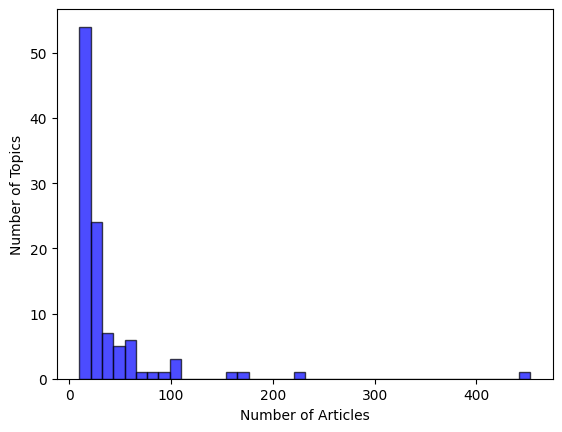

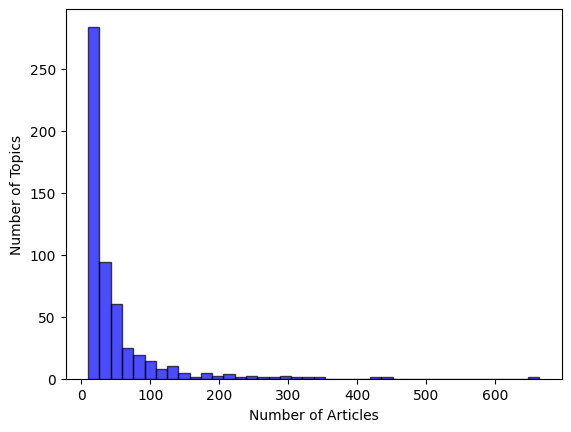

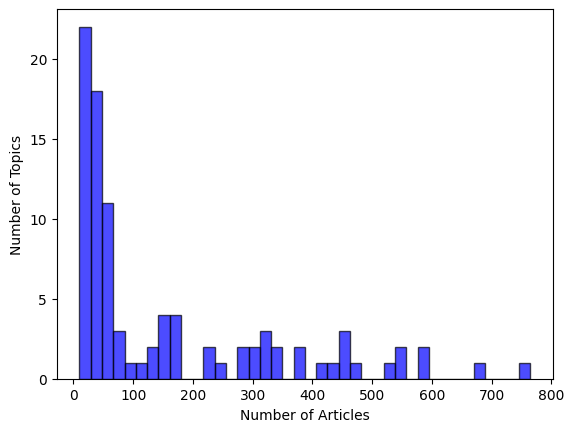

In [ ]:

model_list = [topic_model_autotreduce,topic_model_full,topic_model]

for model in model_list:
  df = pd.DataFrame(model.get_topic_info())

  #### FILTERING OUT THE EXTREME catch all topics
  df_filtered = df[df['Count'] <= 1000]


  plt.hist(df_filtered['Count'], bins=40, color='blue', edgecolor='black', alpha=0.7)
  model_name = str(model).split("(")[0]

  plt.xlabel('Number of Articles')
  plt.ylabel('Number of Topics')
  #plt.title(f'Dist of the size of Topic Clusters for Model: {model_name}')


  plt.show()

Get the topics with the most articles.
Ignore topic -1, its the catch all for all ungrouped articles.  
Compare across candidate models

In [ ]:
 topic_model.get_topic_freq().head()

,Topic,Count
0,-1,11736
15,0,2508
16,1,2055
18,2,1590
21,3,1474


In [ ]:
 topic_model_autotreduce.get_topic_freq().head()

,Topic,Count
0,0,21287
1,-1,11871
2,1,453
3,2,222
50,3,169


In [ ]:
 topic_model_full.get_topic_freq().head(50)


,Topic,Count
0,-1,11736
18,0,664
3,1,444
2,2,420
53,3,352
118,4,323
12,5,310
172,6,304
19,7,288
75,8,277


For a particular article, get the topic representatiosn words with the relative importance



In [ ]:
topic_model_full.get_topic(0)

[('facebook', 0.018957144465693684),
 ('twitter', 0.018743580209310447),
 ('tech', 0.016006085383432185),
 ('google', 0.01335299812403585),
 ('ceo', 0.011059719731670381),
 ('big', 0.009580292291349614),
 ('censorship', 0.009291100327832076),
 ('antitrust', 0.009286239183787974),
 ('social', 0.008936551308229545),
 ('dorsey', 0.007967788410039667)]

In [ ]:
model_list = [topic_model_autotreduce,topic_model_full,topic_model]

for model in model_list:
  #print(model)
  info = model.get_topic(0)
  print(info)


[('the', 0.008393783001029304), ('to', 0.00795587163960812), ('of', 0.007728517498243398), ('in', 0.007388170994040241), ('on', 0.007199913482027161), ('and', 0.007125544025908167), ('that', 0.006789601124630841), ('trump', 0.006713627455928723), ('for', 0.006676047796896656), ('president', 0.006529774336416665)]
[('facebook', 0.018957144465693684), ('twitter', 0.018743580209310447), ('tech', 0.016006085383432185), ('google', 0.01335299812403585), ('ceo', 0.011059719731670381), ('big', 0.009580292291349614), ('censorship', 0.009291100327832076), ('antitrust', 0.009286239183787974), ('social', 0.008936551308229545), ('dorsey', 0.007967788410039667)]
[('biden', 0.021183453213729917), ('joe', 0.015440968979035994), ('vice', 0.012869230544254321), ('presidential', 0.01252297653355024), ('president', 0.011109870044956727), ('debate', 0.010420012363400058), ('sanders', 0.010391965270793155), ('hunter', 0.009345139589820792), ('bidens', 0.009185852864422805), ('pence', 0.008924970229103952)]


investigate classifications at the document level

In [ ]:
topic_model.get_document_info(text_list)

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,"trump shifts tone, says he’s ‘proud’ of fed am...",53,53_economy_economic_kudlow_dow,"[economy, economic, kudlow, dow, recession, co...",[kudlow predicts 'self-sustaining' economic re...,economy - economic - kudlow - dow - recession ...,0.635174,False
1,"iran paid bounties for targeting us troops, in...",185,185_bounties_bounty_intelligence_russian,"[bounties, bounty, intelligence, russian, russ...",[ james inhofe vows ‘strong response’...,bounties - bounty - intelligence - russian - r...,0.371031,False
2,us forces rescue american citizen held hostage...,-1,-1_in_the_and_of,"[in, the, and, of, to, trump, on, president, f...",[democrats demand trump stop building border w...,in - the - and - of - to - trump - on - presid...,0.000000,False
3,"trump slams relief bill, calls on congress to ...",58,58_stimulus_payments_billion_checks,"[stimulus, payments, billion, checks, relief, ...","[for coronavirus relief, trump demands congres...",stimulus - payments - billion - checks - relie...,0.785846,False
4,naomi osaka withdraws from french open to focu...,-1,-1_in_the_and_of,"[in, the, and, of, to, trump, on, president, f...",[democrats demand trump stop building border w...,in - the - and - of - to - trump - on - presid...,0.000000,False
...,...,...,...,...,...,...,...,...
37039,listen: 2020 republican national convention by...,64,64_convention_speakers_dnc_national,"[convention, speakers, dnc, national, democrat...",[2020 republican national convention speakers ...,convention - speakers - dnc - national - democ...,1.000000,False
37040,new poll: americans overwhelmingly support vot...,-1,-1_in_the_and_of,"[in, the, and, of, to, trump, on, president, f...",[democrats demand trump stop building border w...,in - the - and - of - to - trump - on - presid...,0.000000,False
37041,biden to pick north carolina regulator michael...,57,57_climate_environmental_change_kerry,"[climate, environmental, change, kerry, epa, g...","[biden introduces climate team, calls climate ...",climate - environmental - change - kerry - epa...,0.631341,False
37042,harris: 'you ushered in a new day for america'...,14,14_harris_kamala_mate_running,"[harris, kamala, mate, running, vice, dca, tic...",[chris wallace claims kamala harris is ‘not fa...,harris - kamala - mate - running - vice - dca ...,0.529871,False


In [ ]:
topic_model_autotreduce.get_document_info(text_list)

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,"trump shifts tone, says he’s ‘proud’ of fed am...",0,0_the_to_of_in,"[the, to, of, in, on, and, that, trump, for, p...",[trump says he will not call george w. bush or...,the - to - of - in - on - and - that - trump -...,0.578901,False
1,"iran paid bounties for targeting us troops, in...",0,0_the_to_of_in,"[the, to, of, in, on, and, that, trump, for, p...",[trump says he will not call george w. bush or...,the - to - of - in - on - and - that - trump -...,0.355524,False
2,us forces rescue american citizen held hostage...,-1,-1_the_to_of_in,"[the, to, of, in, and, on, that, for, trump, is]",[biden facing enthusiasm gap even as polls sho...,the - to - of - in - and - on - that - for - t...,0.000000,False
3,"trump slams relief bill, calls on congress to ...",0,0_the_to_of_in,"[the, to, of, in, on, and, that, trump, for, p...",[trump says he will not call george w. bush or...,the - to - of - in - on - and - that - trump -...,1.000000,False
4,naomi osaka withdraws from french open to focu...,1,1_mask_masks_wear_wearing,"[mask, masks, wear, wearing, mandate, face, pu...","[donald trump: wear a mask, they have an impac...",mask - masks - wear - wearing - mandate - face...,0.221640,False
...,...,...,...,...,...,...,...,...
37039,listen: 2020 republican national convention by...,0,0_the_to_of_in,"[the, to, of, in, on, and, that, trump, for, p...",[trump says he will not call george w. bush or...,the - to - of - in - on - and - that - trump -...,0.537735,False
37040,new poll: americans overwhelmingly support vot...,0,0_the_to_of_in,"[the, to, of, in, on, and, that, trump, for, p...",[trump says he will not call george w. bush or...,the - to - of - in - on - and - that - trump -...,0.746635,False
37041,biden to pick north carolina regulator michael...,0,0_the_to_of_in,"[the, to, of, in, on, and, that, trump, for, p...",[trump says he will not call george w. bush or...,the - to - of - in - on - and - that - trump -...,0.498991,False
37042,harris: 'you ushered in a new day for america'...,0,0_the_to_of_in,"[the, to, of, in, on, and, that, trump, for, p...",[trump says he will not call george w. bush or...,the - to - of - in - on - and - that - trump -...,0.973679,False


Autoreduce -- leads to stopwords as representations

# save data file with document level cluster information

In [ ]:
document_info = topic_model_full.get_document_info(text_list)
df = pd.DataFrame(document_info)

In [ ]:
output_file_path = "/content/gdrive/MyDrive/AdvancedML/full_model_documents_classified.csv"
df.to_csv(output_file_path, index=False)

In [ ]:
len(text_list)

37044

# Topic Representations Fine Tuning

In [ ]:

representation_model = KeyBERTInspired()
topic_model_fine_tune = BERTopic(representation_model=representation_model)
topics, probs = topic_model_fine_tune.fit_transform(text_list)



modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
topic_model_fine_tune.get_topic(0)

[('breitbart', 0.4644182),
 ('twitter', 0.4358866),
 ('tweets', 0.42310834),
 ('tweet', 0.40813875),
 ('twitters', 0.4079436),
 ('zuckerberg', 0.40277928),
 ('censorship', 0.3935003),
 ('dorsey', 0.37526098),
 ('ceo', 0.36688733),
 ('censoring', 0.34814385)]

In [ ]:
topic_model_fine_tune.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,11890,-1_election_voters_trump_presidential,"[election, voters, trump, presidential, sander...",[pelosi on mail-in ballot push: ‘we’re now cal...
1,0,665,0_breitbart_twitter_tweets_tweet,"[breitbart, twitter, tweets, tweet, twitters, ...","[facebook, twitter grilled for censorship of n..."
2,1,456,1_masks_mask_maskwearing_masking,"[masks, mask, maskwearing, masking, maskless, ...",[poll: 9 of 10 americans wearing masks in publ...
3,2,409,2_hearings_barrett_nominee_scalia,"[hearings, barrett, nominee, scalia, judge, se...",[how amy coney barrett’s nomination may affect...
4,3,391,3_biden_breitbart_dealings_bidens,"[biden, breitbart, dealings, bidens, joe, hunt...",[schweizer: joe biden ‘at the center’ of hunte...
...,...,...,...,...,...
552,551,10,551_sanders_bernie_coronavirus_covid,"[sanders, bernie, coronavirus, covid, bipartis...","[ bernie sanders demands $1,200 direc..."
553,552,10,552_maga_hats_hat_magathetimes,"[maga, hats, hat, magathetimes, hatthe, pigeon...",[maga hats allowed in california polling place...
554,553,10,553_secession_civil_war_political,"[secession, civil, war, political, america, am...",[is a new secession movement growing in americ...
555,554,10,554_mattis_matthew_colonel_trumpdowd,"[mattis, matthew, colonel, trumpdowd, militar,...",[pence: mattis is ‘wrong’ about trump during a...


# Test representation tuning with n-grams

In [ ]:
#To make this work, need the topics associates with the best model feed in

#topic_model_full.update_topics(text_list, topics, n_gram_range=(1, 3)) #, stop_words="english")
#topic_model.update_topics(text_list, topics, n_gram_range=(1, 3)) #, stop_words="english")


In [ ]:
# from sklearn.feature_extraction.text import CountVectorizer

# cv = CountVectorizer(ngram_range=(1, 3), stop_words="english")
# model.update_topics(text_list, topics, vectorizer=cv)

# Visualizations

Start by reviewing 2D representatios of the different models

In [ ]:
topic_model_full.visualize_topics()

In [ ]:
topic_model.visualize_topics()


In [ ]:
topic_model_autotreduce.visualize_topics()

In [ ]:
topic_model_fine_tune.visualize_topics()

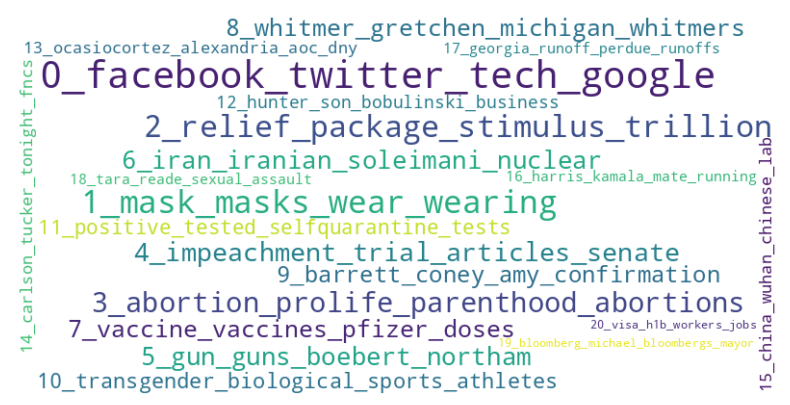

In [ ]:
# Word cloud of cluster representations sized by number of articles in that cluster

filtered_df = df[df['Topic'] != -1]
filtered_df = filtered_df[filtered_df['Topic'] <= 20]

word_freq = dict(zip(filtered_df['Name'], filtered_df['Count']))

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


# Explore top clusters and the cluster heriarchy -- goes into final analysis

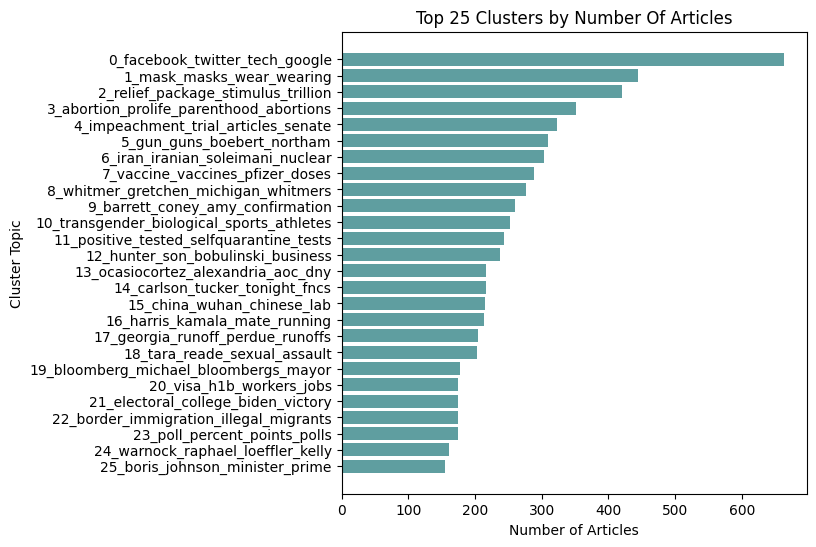

In [ ]:
## careful about the order this is run -- nned to tie it to the right DF

filtered_df = df[(df['Topic'] != -1) & (df['Topic'] <= 25)]


topic_counts = filtered_df.groupby('Topic')['Count'].sum().sort_values(ascending=False)

topic_names = filtered_df.groupby('Topic')['Name'].first().loc[topic_counts.index]

plt.figure(figsize=(6, 6))
plt.barh(topic_names, topic_counts.values, color='cadetblue')
plt.xlabel('Number of Articles')
plt.ylabel('Cluster Topic')
plt.title('Top 25 Clusters by Number Of Articles')
plt.gca().invert_yaxis()
plt.show()

In [ ]:
topic_model_full.visualize_hierarchy()

# Explore other visuals

In [ ]:
topic_model_full.visualize_heatmap(n_clusters=20)

In [ ]:
topic_model_full.visualize_barchart()

In [ ]:
topic_model_full.visualize_term_rank(log_scale=True)

# calculate distance between topics in full model

In [ ]:

distance_matrix = cosine_similarity(np.array(topic_model_full.topic_embeddings_))
dist_df = pd.DataFrame(distance_matrix, columns=topic_model_full.topic_labels_.values(),
                       index=topic_model_full.topic_labels_.values())

tmp = []
for rec in dist_df.reset_index().to_dict('records'):
    t1 = rec['index']
    for t2 in rec:
        if t2 == 'index':
            continue
        tmp.append(
            {
                'topic1': t1,
                'topic2': t2,
                'distance': rec[t2]
            }
        )

pair_dist_df = pd.DataFrame(tmp)

pair_dist_df = pair_dist_df[(pair_dist_df.topic1.map(
      lambda x: not x.startswith('-1'))) &
            (pair_dist_df.topic2.map(lambda x: not x.startswith('-1')))]
pair_dist_df = pair_dist_df[pair_dist_df.topic1 < pair_dist_df.topic2]
pair_dist_df.sort_values('distance', ascending = False).head(20)

,topic1,topic2,distance
13162,23_poll_percent_points_polls,81_poll_battleground_leads_points,0.915709
92688,169_fauci_anthony_dr_infectious,37_fauci_anthony_dr_infectious,0.907186
89952,164_pelosi_nancy_speaker_testing,26_pelosi_nancy_speaker_relief,0.885869
105165,191_portland_oregon_protesters_lasers,524_portland_oregon_courthouse_fence,0.876341
168208,307_nursing_homes_patients_cuomo,347_nursing_cuomo_deaths_homes,0.875318
2161,2_relief_package_stimulus_trillion,525_relief_agreement_axne_schumer,0.870911
90016,164_pelosi_nancy_speaker_testing,90_pelosi_nancy_speaker_union,0.866566
17795,31_biden_joe_coronavirus_wilmington,354_teleprompter_joe_teleconferencing_virtual,0.862779
115623,211_sanders_nevada_bernie_ivt,82_sanders_bernie_ivt_vermont,0.862674
121053,221_briefings_conferences_lamestream_airing,62_briefing_task_force_white,0.862090


## silhouette_score implementations

adapted from https://github.com/MaartenGr/BERTopic/issues/428.
not implemented in final product

In [ ]:
topic_model_full.topic_embeddings_

array([[ 0.00361024,  0.0055958 ,  0.02225169, ..., -0.02430933,
         0.00393424,  0.0143987 ],
       [-0.01869554, -0.00809389,  0.02062254, ..., -0.05187592,
         0.02976741,  0.00920994],
       [ 0.0217722 ,  0.04438504,  0.04171636, ..., -0.03328518,
        -0.02713183,  0.02068683],
       ...,
       [-0.00703212, -0.00215689,  0.06459112, ..., -0.02877673,
         0.04833608,  0.02676817],
       [-0.07928334, -0.00040211, -0.03215287, ..., -0.03053491,
         0.0089947 , -0.02345442],
       [-0.03123736, -0.05062756,  0.06026456, ..., -0.0001595 ,
        -0.05216656,  0.02376712]], dtype=float32)

In [ ]:
from sklearn.metrics import silhouette_score
from sentence_transformers import SentenceTransformer

from umap import UMAP
import numpy as np

#sentence_model = SentenceTransformer("all-MiniLM-L6-v2")
#embeddings = sentence_model.encode(text_list, convert_to_tensor=False)


embeddings = topic_model_full.topic_embeddings_

# be careful about the topics fed into the model, and thats its from the one of interest
#remove outliers
umap_embeddings = topic_model_full.umap_model.transform(embeddings)
indices = [index for index, topic in enumerate(topics) if topic != -1]
X = umap_embeddings[np.array(indices)]
labels = [topic for index, topic in enumerate(topics) if topic != -1]


#silhouette_score(X, labels)